In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import harmonypy as hm
import anndata
import os
from matplotlib import pyplot as plt
import seaborn as sns
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')


In [2]:
os.chdir('/home/groups/singlecell/smorabito/analysis/SERPENTINE/')
data_dir = 'data/'
fig_dir = 'figures/'


In [3]:
# re-load the processed dataset 
adata = sc.read_h5ad('{}SERPENTINE_PCA_annotated_14-05-24.h5ad'.format(data_dir))

### Notes about what plots the collaborators are looking for

Look only in the Endometrial Cancer (EC) patients

* Please include expression levels of each gene, separately of the other 3 genes, per sample.
* Please have a joint plot for all 4 genes in different combinations, per sample.
* Please highlight expression in tumor vs normal epithelial cells, if possible.
* Please indicate gene expression per endometrial cancer subtypes ( POLE ultramutated, microsatellite instability hypermutated, copy number low, and copy number high).
* Please see if these any correlation of tumor cells and any specific type of immune cell.


1.Samples ESP_1_07 is patient 7? --> **Yes**

2.Expected to see FRa in CD45 positive cells? --> **We don't see it**

3.RNA expression of a gene was normalized to all genes expressed? **Yes**

4.Could you show combined expression of genes (FRa+B7H4+ for example)? --> **Not clear how this would be done**

5.Tumor / normal separation? --> **Yeah tumor vs normal does separate**

6.Correlation of tumor cells with any specific type of immune cell. --> **Done**





In [4]:
# subset the tumor cells only:
adata_tumor = adata[adata.obs.general_annot == 'Tumor'].copy()

# subset the cells from endometrial cancer patients
adata_tumor = adata_tumor[adata_tumor.obs['Tumor Type'] == 'Endometrial'].copy()

adata_tumor.shape

(43098, 36601)

In [5]:
# make a new UMAP for the tumor cells:
sc.tl.umap(adata_tumor, min_dist=0.35, method='umap')

/home/groups/singlecell/smorabito/.conda/envs/serp-scanpy/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [6]:
adata_tumor.obsm['X_umap_pca'] = adata_tumor.obsm['X_umap']

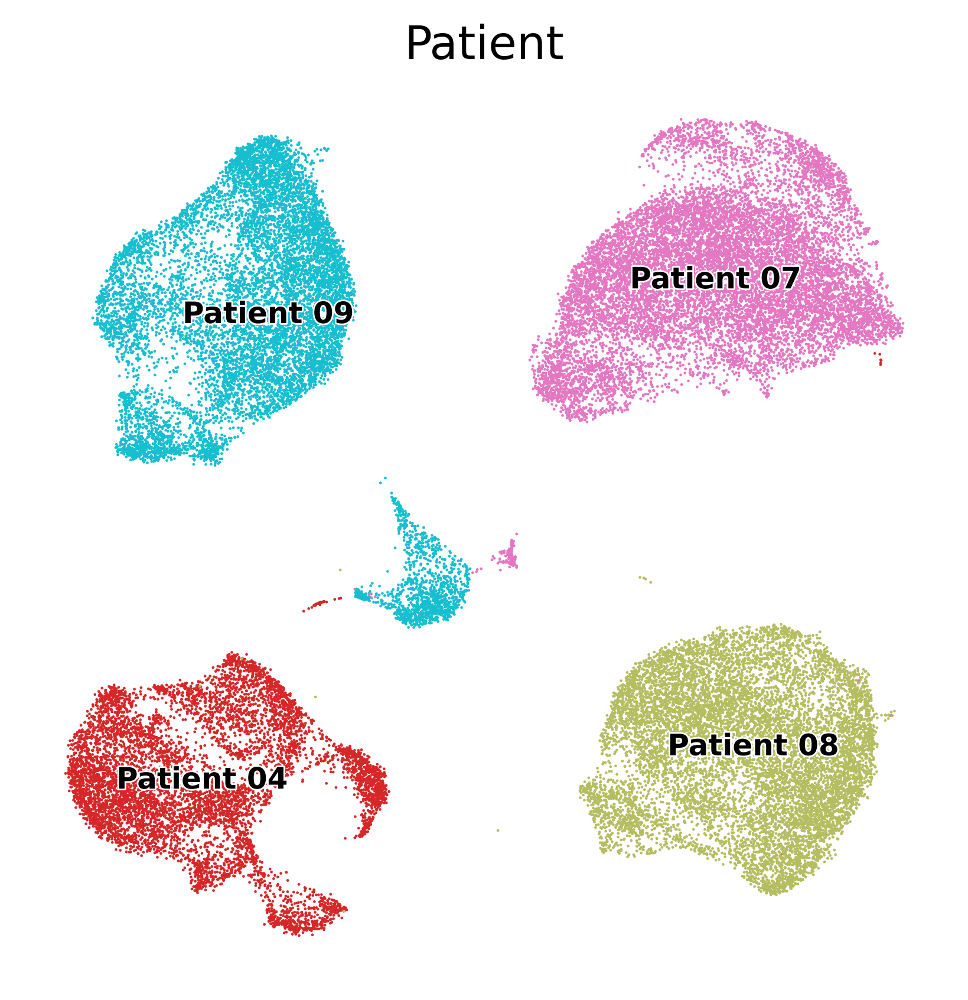

In [7]:
sc.settings.set_figure_params(dpi=200, dpi_save=500, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata_tumor, 
    color='Patient',
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    ncols=1,
    save='_tumor_Patient_PCA.pdf'
)

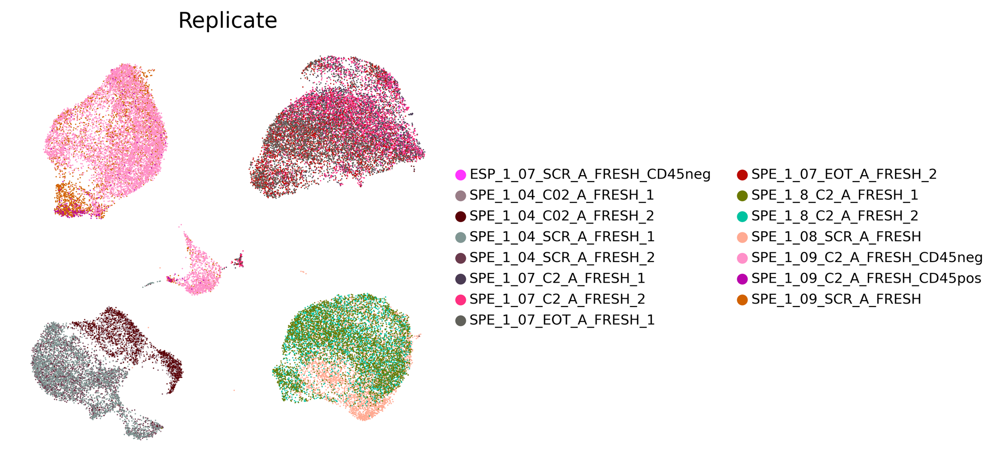

In [8]:
sc.settings.set_figure_params(dpi=200, dpi_save=500, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata_tumor, 
    color='Replicate',
    frameon=False, 
   # legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    ncols=1,
    save='_tumor_Replicate_PCA.pdf'
)

In [9]:
# Run Harmony
sc.external.pp.harmony_integrate(adata_tumor, key = ['Subproject_CNAG_x'])
sc.pp.neighbors(adata_tumor, use_rep = 'X_pca_harmony', n_neighbors=20, n_pcs=30, metric='cosine')

2024-05-21 14:09:58,051 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-05-21 14:10:02,350 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-05-21 14:10:02,750 - harmonypy - INFO - Iteration 1 of 10
2024-05-21 14:10:18,421 - harmonypy - INFO - Iteration 2 of 10
2024-05-21 14:10:34,052 - harmonypy - INFO - Converged after 2 iterations


In [10]:
sc.tl.umap(adata_tumor, min_dist=0.35, method='umap')

In [11]:
adata_tumor.obsm['X_umap_harmony'] = adata_tumor.obsm['X_umap']

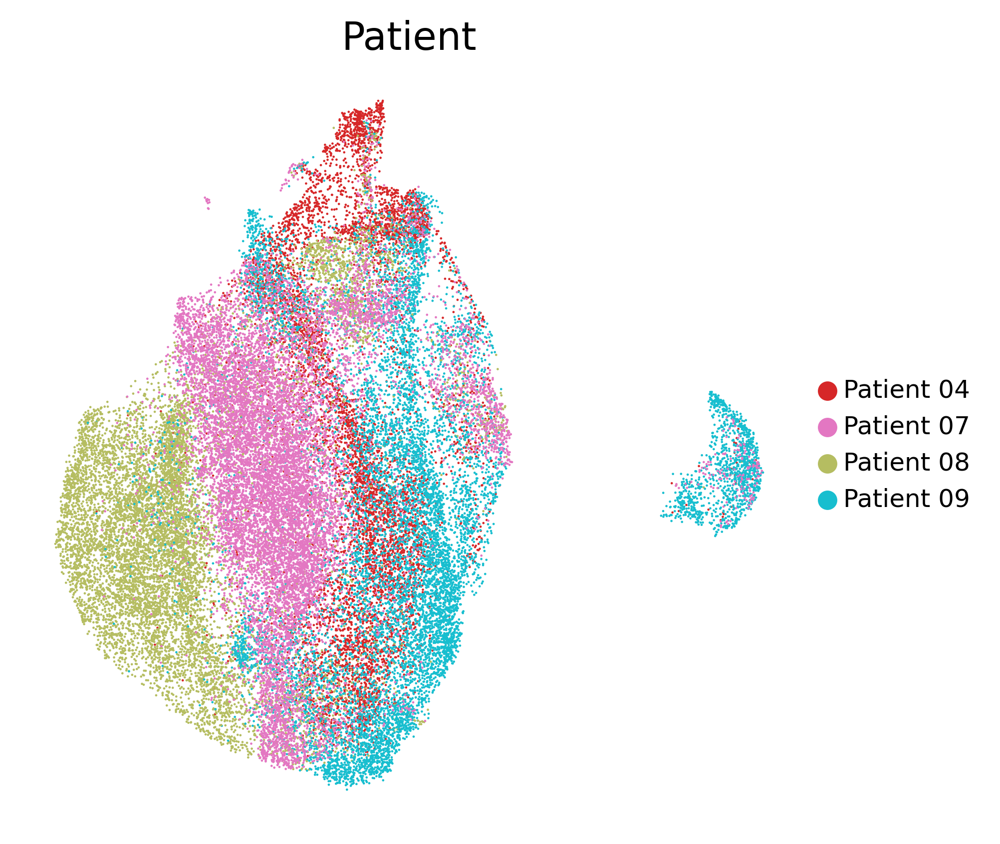

In [12]:
sc.settings.set_figure_params(dpi=200, dpi_save=500, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata_tumor, 
    color='Patient',
    frameon=False, 
   # legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    ncols=1,
    save='_tumor_Patient_Harmony.pdf'
)

<Axes: xlabel='Replicate'>

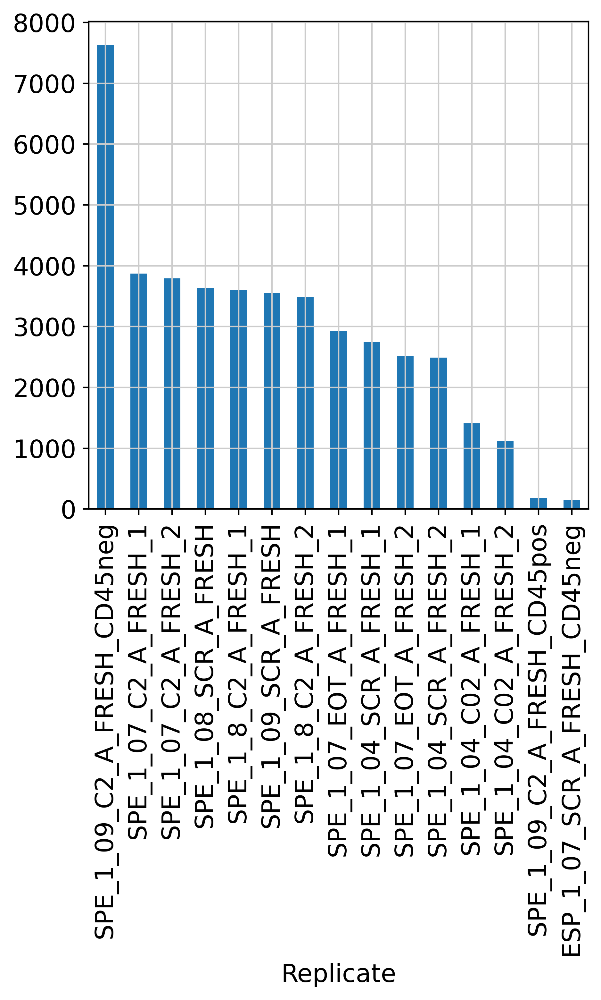

In [13]:
adata_tumor.obs.Replicate.value_counts().plot.bar()

### Pt 1. Plot expression levels of each gene

* Violin Plot
* Split UMAPs


In [5]:
# define gene list 
gene_list = [
    'ERBB2', # HER2
    'TACSTD2', # TROP2
    'VTCN1', # B7H4
    'FOLR1' # FRa
]

# compute a gene score for these 4 genes combined:
# sc.tl.score_genes(adata_tumor, gene_list = gene_list, score_name = 'combined')
# gene_list.append('combined')

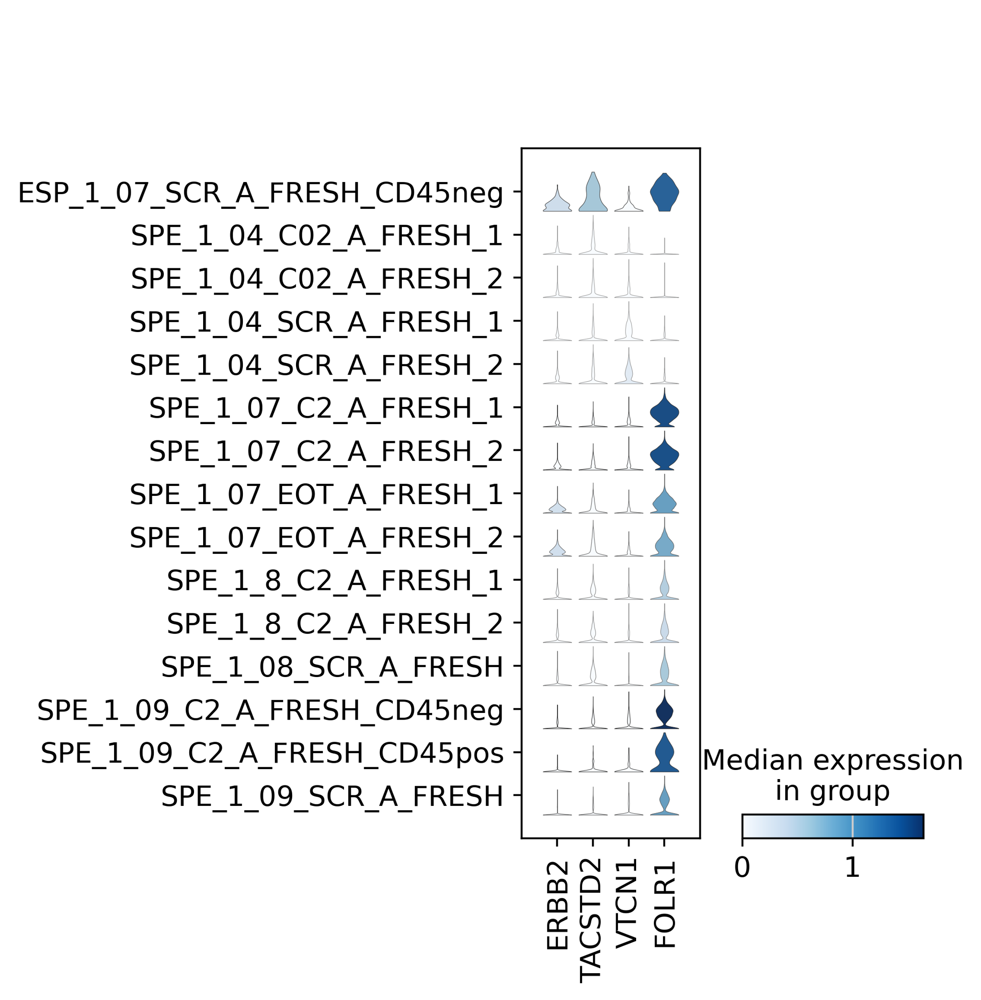

In [16]:
sc.settings.set_figure_params(dpi=200, dpi_save=400, figsize=(10,3), facecolor='white')
sc.pl.stacked_violin(
    adata_tumor, gene_list, 
    groupby='Replicate',
    save = 'stacked_violin_Replicates.pdf'
)




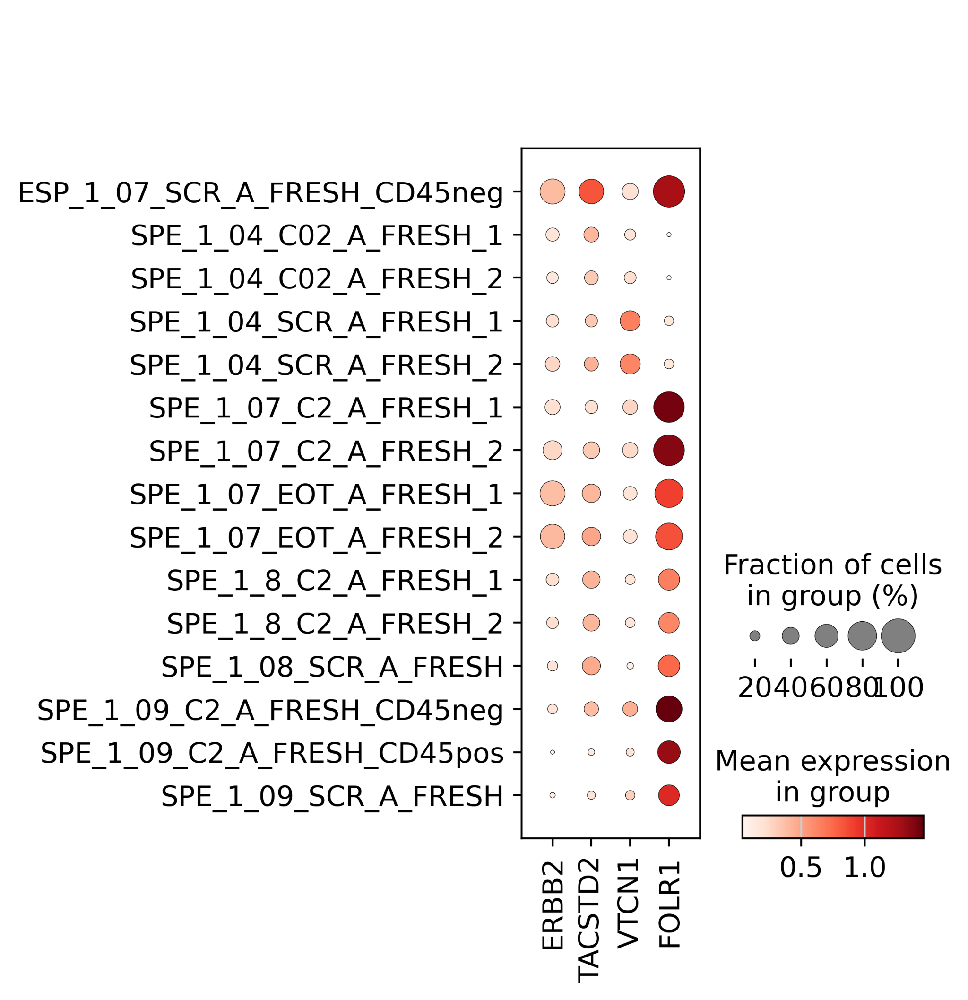

In [20]:
sc.settings.set_figure_params(dpi=200, dpi_save=400, figsize=(10,3), facecolor='white')
sc.pl.dotplot(
    adata_tumor, gene_list, 
    groupby='Replicate',
    save = '_dotplot_Replicates.pdf'
)




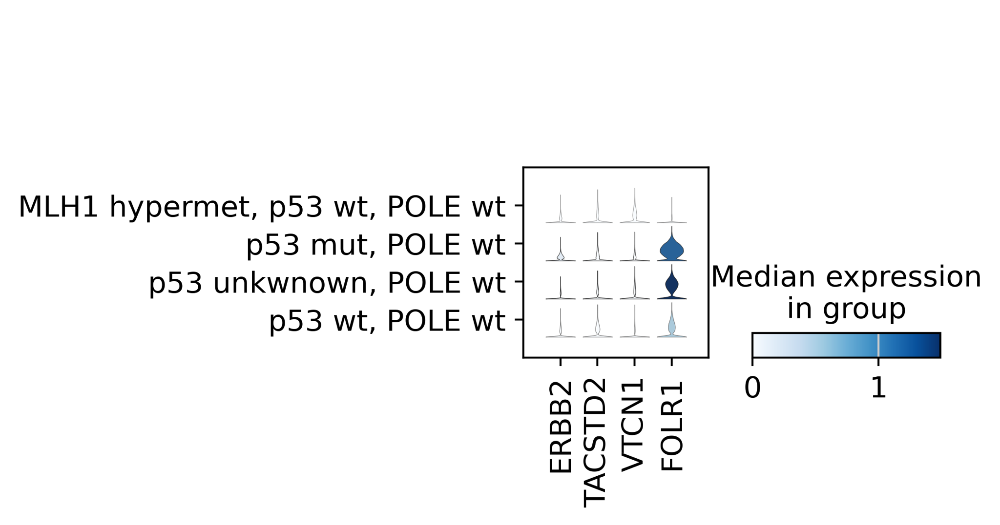

In [17]:
sc.settings.set_figure_params(dpi=200, dpi_save=400, figsize=(10,3), facecolor='white')
sc.pl.stacked_violin(
    adata_tumor, gene_list, 
    groupby='Molecular profile',
    save = 'stacked_violin_molecular_profile.pdf'
)


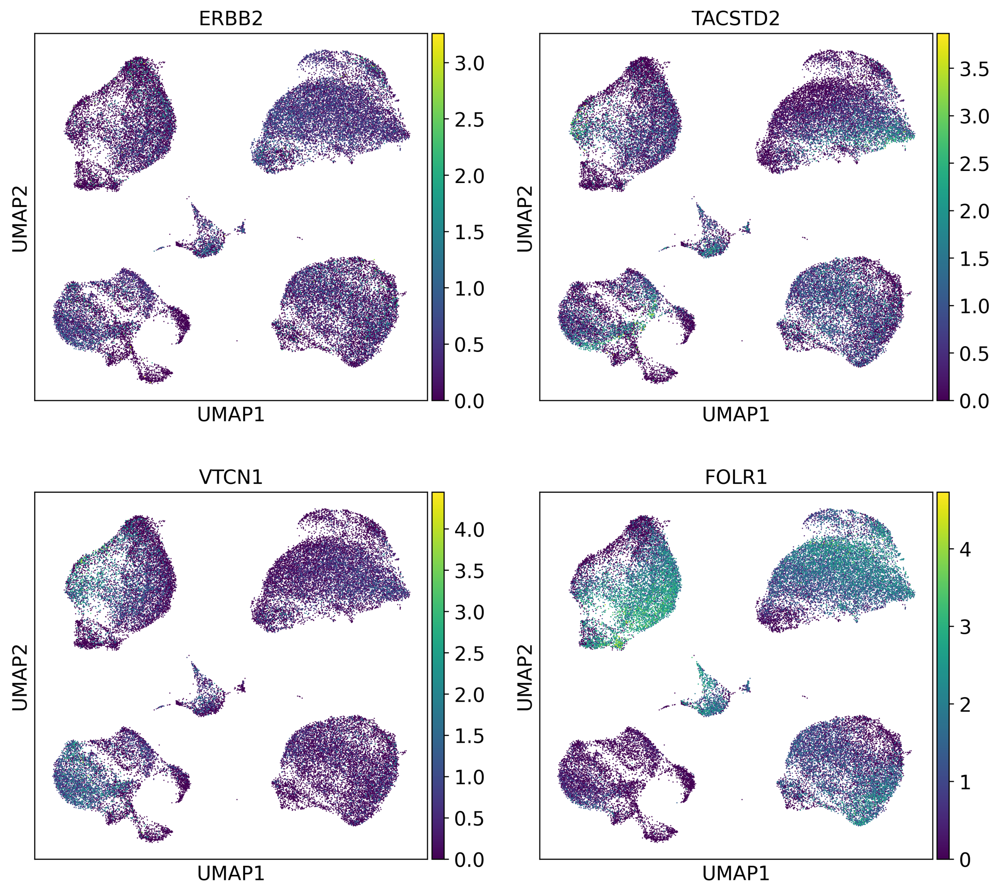

In [18]:
# plot UMAPs (ugh)

adata_tumor.obsm['X_umap'] = adata_tumor.obsm['X_umap_pca']

sc.settings.set_figure_params(dpi=200, dpi_save=500, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata_tumor, 
    color=gene_list,
    frameon=True, 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    ncols=2,
    save='_test_genes.pdf'
)

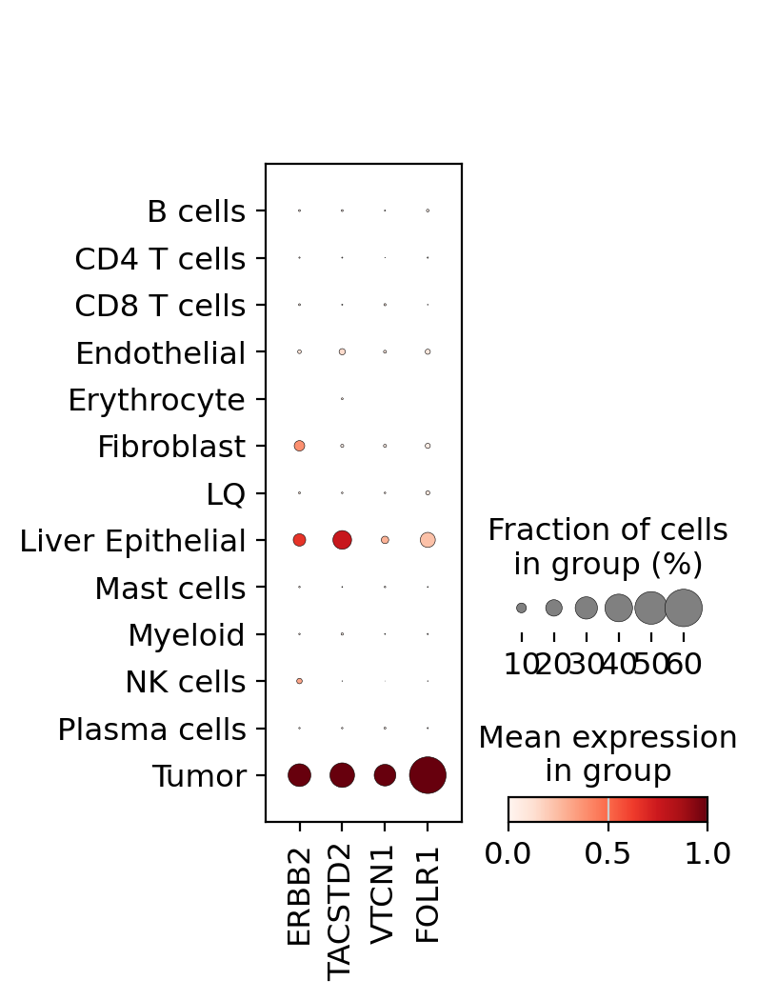

In [19]:

sc.settings.set_figure_params(dpi=100, dpi_save=300, figsize=(15,5), facecolor='white')




sc.pl.dotplot(
    adata[adata.obs.Replicate.isin(adata_tumor.obs.Replicate.unique())], 
    gene_list, 'lv1_annot',
    standard_scale='var', swap_axes=False,
    save = '_test_genes_dotplot.pdf'
)

#sc.pl.dotplot(adata, marker_dict, groupby='leiden', figsize=(12,6), standard_scale='var',  dendrogram=True, save='markers.pdf')

### Pt. 2: Joint plots comparing genes

In [43]:
gene_1 = gene_list[0]
gene_2 = gene_list[1]

# list of replicates:
replicates = adata_tumor.obs.Replicate.unique().to_list()

cur_rep = replicates[0]

cur_adata = adata_tumor[adata_tumor.obs.Replicate == cur_rep].copy()


/scratch_tmp/23379578/ipykernel_28209/409569807.py:5: FutureWarning: Categorical.to_list is deprecated and will be removed in a future version. Use obj.tolist() instead
  replicates = adata_tumor.obs.Replicate.unique().to_list()


In [45]:
cur_X = cur_adata.X 
cur_df = cur_adata.obs

In [21]:
cur_df = sc.get.obs_df(
    adata_tumor, 
    keys = gene_list
)

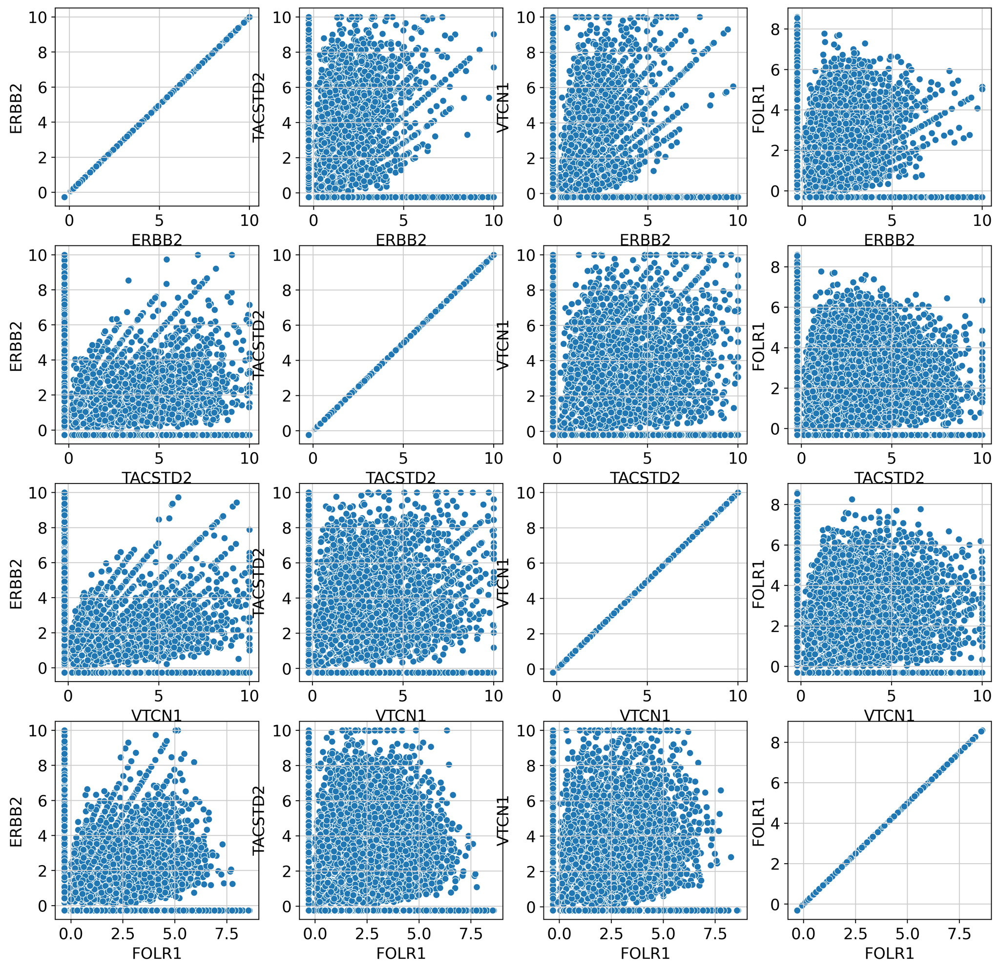

In [79]:
sc.settings.set_figure_params(dpi=200, dpi_save=500, figsize=(15,15), facecolor='white')



fig, axes = plt.subplots(4, 4)

for i, gene_1 in enumerate(gene_list):
    for j, gene_2 in enumerate(gene_list):
        sns.scatterplot(
            data = cur_df,
            x = gene_1,
            y = gene_2,
            ax = axes[i][j]
        )


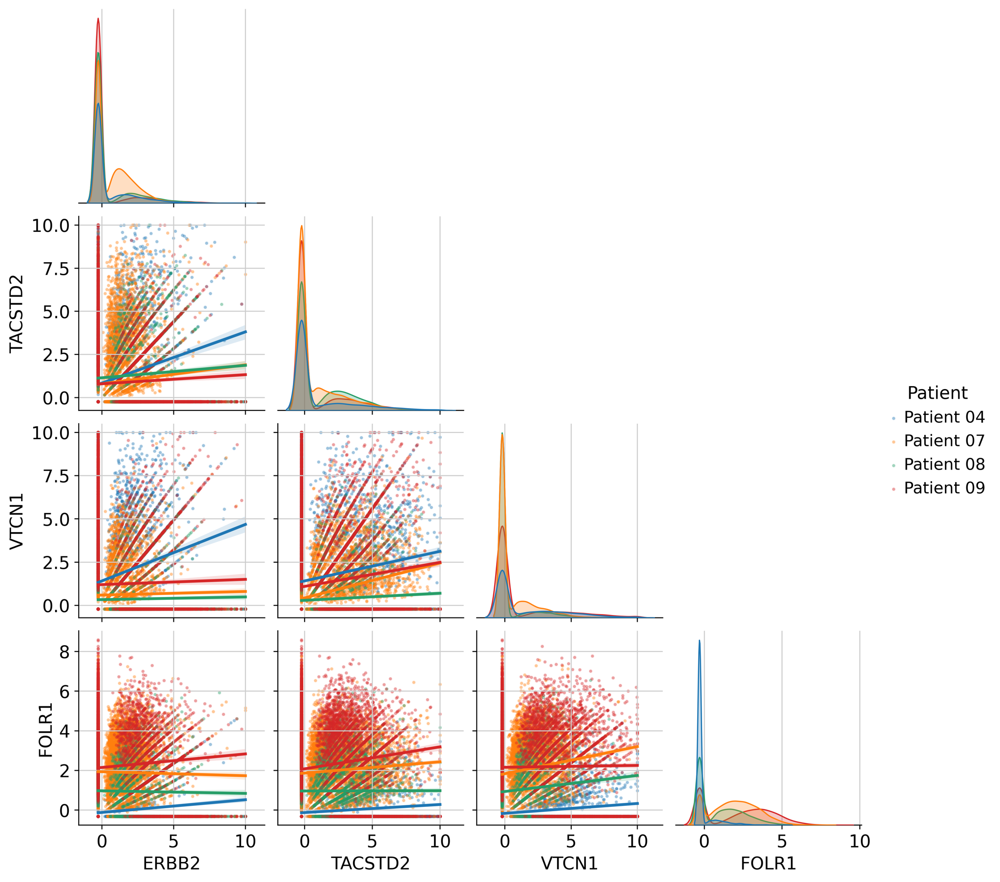

In [23]:
my_list = gene_list.copy()
my_list.append('Patient')

cur_df = sc.get.obs_df(
    adata_tumor, 
    keys = my_list
)

sns.pairplot(
    cur_df, kind='reg', corner=True, hue='Patient',
    plot_kws={"scatter_kws":{"s":3, "alpha": 0.3}}
)

### Compute pairwise correlations of cell counts

Yeah I don't want to send this to the collaborators, this doesn't make sense. We mostly see Tumor cells in the CD45- fraction, in which case we know it's not immune cells. Maybe we can just take the "FRESH" samples rather than the sorted and then it makes more sense?

In [6]:
# which replicates have tumor cells?
tumor_reps = adata.obs[adata.obs.general_annot == 'Tumor'].Replicate.astype(str).unique()
ix = [True if "CD45" not in x else False for x in tumor_reps]
tumor_reps = tumor_reps[ix]

In [7]:
# get endometrial patients 
cur_adata = adata[adata.obs['Tumor Type'] == 'Endometrial'].copy()
cur_adata = cur_adata[cur_adata.obs.Replicate.isin(tumor_reps)].copy()
cur_adata = cur_adata[cur_adata.obs.general_annot != 'LQ'].copy()
cur_adata.shape

(93326, 36601)

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
 [Text(0, 0, 'SPE_1_04_C02_A_FRESH_1'),
  Text(1, 0, 'SPE_1_04_C02_A_FRESH_2'),
  Text(2, 0, 'SPE_1_04_SCR_A_FRESH_1'),
  Text(3, 0, 'SPE_1_04_SCR_A_FRESH_2'),
  Text(4, 0, 'SPE_1_07_C2_A_FRESH_1'),
  Text(5, 0, 'SPE_1_07_C2_A_FRESH_2'),
  Text(6, 0, 'SPE_1_07_EOT_A_FRESH_1'),
  Text(7, 0, 'SPE_1_07_EOT_A_FRESH_2'),
  Text(8, 0, 'SPE_1_8_C2_A_FRESH_1'),
  Text(9, 0, 'SPE_1_8_C2_A_FRESH_2'),
  Text(10, 0, 'SPE_1_08_SCR_A_FRESH'),
  Text(11, 0, 'SPE_1_09_SCR_A_FRESH')])

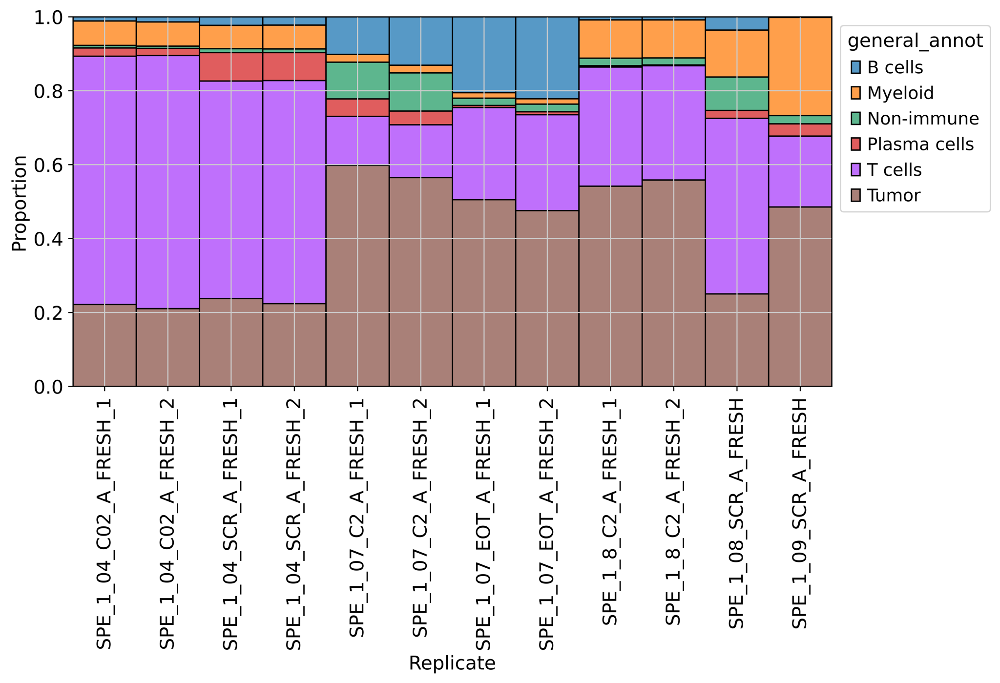

In [8]:
sc.settings.set_figure_params(dpi=400, dpi_save=500, figsize=(10,5), facecolor='white')
ax = sns.histplot(
    data = cur_adata.obs,
    hue = 'general_annot',
    x = 'Replicate',
    multiple='fill', stat='proportion',
    discrete=True
)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.xticks(rotation=90)

In [9]:
# compute the number of cells for each rep
df = cur_adata.obs.groupby(['Replicate', 'lv1_annot']).size()
df = df.reset_index(level=[0,1])
df = df.rename({0: 'count'}, axis=1)
df = df.pivot(index='Replicate', columns='lv1_annot', values='count')
#df.head()

/scratch_tmp/23379578/ipykernel_245579/314337873.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = cur_adata.obs.groupby(['Replicate', 'lv1_annot']).size()


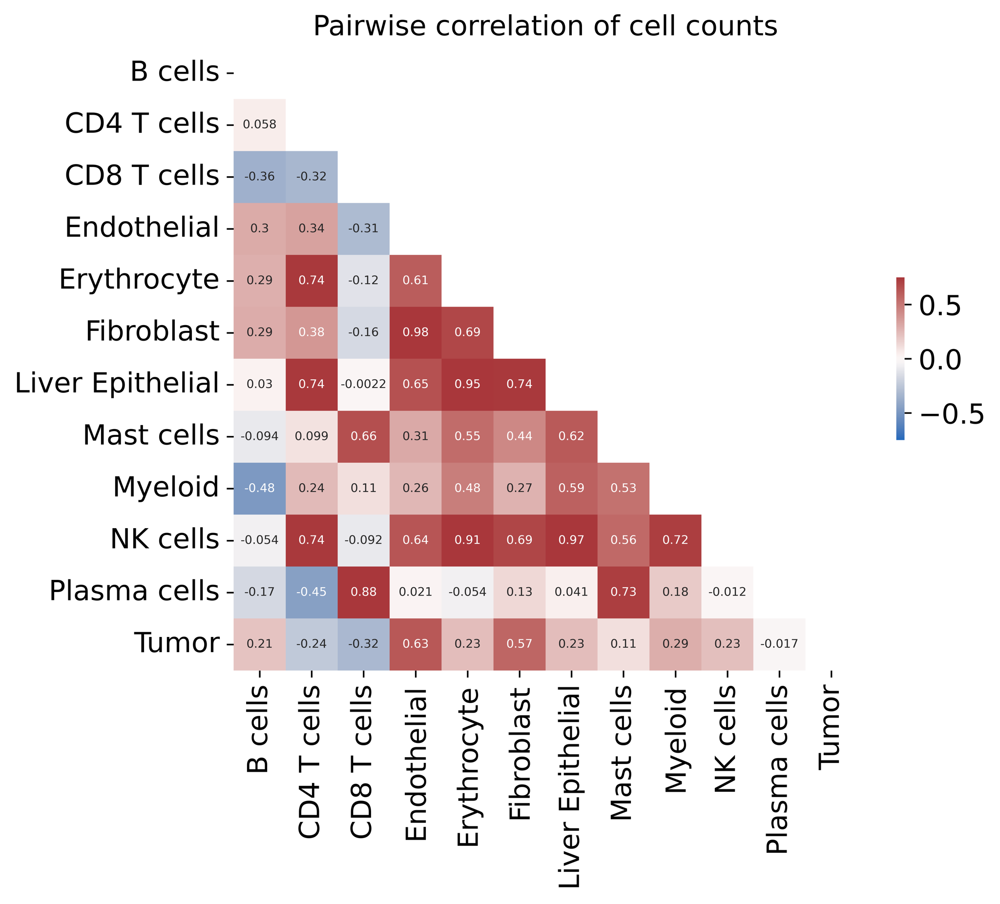

In [10]:

sc.settings.set_figure_params(dpi=400, dpi_save=400, figsize=(7,6), facecolor='white')

# calculate pairwise correlations
corr = df.corr()
matrix = np.triu(corr)

ax = sns.heatmap(
    corr, 
    annot=True, annot_kws={'size':6},
    mask=matrix, 
    square=True, 
    vmax=0.75, vmin=-0.75,
    cmap=sns.color_palette('vlag',as_cmap=True),
    cbar_kws={'shrink': 0.25}
)
ax.grid(False)
ax.set_title('Pairwise correlation of cell counts')
ax.set_ylabel('')
ax.set_xlabel('')
plt.savefig('{}/cell_count_correlations.pdf'.format(fig_dir))

In [16]:
len(adata_tumor.obs.Replicate.unique())

15

In [13]:
adata_tumor.shape

(43098, 36601)

In [14]:
adata.shape

(242485, 36601)

In [17]:
len(adata_tumor.obs.Patient.unique())

4

In [19]:
# compute the number of cells for each rep
df = adata.obs.groupby(['Replicate', 'lv1_annot']).size()
df = df.reset_index(level=[0,1])
df = df.rename({0: 'count'}, axis=1)
df = df.pivot(index='Replicate', columns='lv1_annot', values='count')
df.head()

/scratch_tmp/23379578/ipykernel_245579/2147059515.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = adata.obs.groupby(['Replicate', 'lv1_annot']).size()


lv1_annot,B cells,CD4 T cells,CD8 T cells,Endothelial,Erythrocyte,Fibroblast,LQ,Liver Epithelial,Mast cells,Myeloid,NK cells,Plasma cells,Tumor
Replicate,,,,,,,,,,,,,
ESP_1_03_EOT_A_FRESH_CD45neg,0,3,0,0,0,0,222,0,0,13,0,0,9
ESP_1_03_EOT_A_FRESH_CD45pos,64,3109,3832,1,0,0,25,2,0,1047,195,22,8
ESP_1_07_SCR_A_FRESH_CD45neg,0,1,0,1,1,1,5,0,0,0,0,3,142
ESP_1_07_SCR_A_FRESH_CD45pos,935,1218,697,0,0,0,9,0,0,132,156,111,0
SPE_1_01_C2D1_A_FRESH_1,41,1475,1716,28,1,10,77,11,18,484,351,249,6


In [24]:
(df['Tumor'] > 1000).value_counts()

Tumor
True     20
False    19
Name: count, dtype: int64